# Preprocessing and re-clustering ENS data
##### Runs on stenv3

In [1]:
# imports libraries 
import os
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
from harmony import harmonize
import scanpy.external as sce

In [2]:
# error settings to avoid crowding the notebook
sc.settings.verbosity = 0             
sc.settings.set_figure_params(dpi=80, facecolor='white')

Read in DE genes from ENS paper

In [117]:
de_genes = pd.read_excel('/home/svickovi/data/marker_genes/DE_genes_ENS_paper.xlsx', sheet_name = 'Mouse Colon All')

# Only keep certain columns
aba = de_genes[['ident', 'gene', 'padjH', 'log2fc', 'mean', 'padjD']]

# Only save genes which have fold-change > xx
aba = aba[(aba['log2fc'] > 1) & (aba['padjH'] <0.05)]
print('Total DE genes used: ', len(aba['gene']))

Total DE genes used:  2675


Read in 12w data from ENS paper

In [4]:
anndata_12w = sc.read_h5ad('/home/svickovi/data/sc_anndatas/mli_raw_annotated.h5ad')

# remove unnesecary categories
anndata_12w.obs = anndata_12w.obs.drop(labels=['nGene', 'nUMI', 'num_pcs', 'Segment', 'nCount_RNA','nFeature_RNA','orig.ident_y', 'Region','Date_run','Date_sequenced','Barcode','Raw_Data','Data','Dataset','Sample_ID_Internal','orig.ident_x', 'ident','Overload'], axis=1)
anndata_12w.obs['age'] = "12w"
anndata_12w.obs['predicted_doublets'] = False # uncomment if planning to run scrublet

# Clean up obs
# anndata_12w.var_names = [i.decode("utf-8") for i in anndata_12w.var_names]
# anndata_12w.obs.index = [i.decode("utf-8") for i in anndata_12w.obs.index]
# anndata_12w.obs.Unique_ID = [i.decode("utf-8") for i in anndata_12w.obs.Unique_ID]
# anndata_12w.obs.Sample_ID = [i.decode("utf-8") for i in anndata_12w.obs.Sample_ID]
# anndata_12w.obs.Mouse_ID = [i.decode("utf-8") for i in anndata_12w.obs.Mouse_ID]
# anndata_12w.obs.Sex = [i.decode("utf-8") for i in anndata_12w.obs.Sex]
# anndata_12w.obs.cell_type = [i.decode("utf-8") for i in anndata_12w.obs.cell_type]

# rename for copy 
ref = anndata_12w.copy()

In [5]:
ref.obs

,leiden,Unique_ID,Sample_ID,Mouse_ID,Sex,cell_type,age,predicted_doublets
index,,,,,,,,
M1_S1.AGTAGCTAGCCTGCCA,12,S1,M1_S1,M1,F,Fibroblast,12w,False
M1_S1.CTGTGAATCAAGCCTA,3,S1,M1_S1,M1,F,TA_2,12w,False
M1_S1.TGCTTGCTCGACACCG,16,S1,M1_S1,M1,F,Glia,12w,False
M1_S1.TTCAATCTCATGTCTT,9,S1,M1_S1,M1,F,Cycling_TA_2,12w,False
M1_S1.AGTCACATCTCCTGAC,0,S1,M1_S1,M1,F,TA_1,12w,False
...,...,...,...,...,...,...,...,...
M8_S33.CATATTCGTGGCTCCA,4,S33,M8_S33,M8,M,TA_3,12w,False
M8_S33.ACACTGATCTTGGGTA,25,S33,M8_S33,M8,M,Neuron_1,12w,False
M8_S33.TAGGCATTCAACCAAC,0,S33,M8_S33,M8,M,TA_1,12w,False


Does the same data pp and normalization as for the other ages

In [6]:
sc.pp.filter_cells(ref, min_genes=500)
sc.pp.filter_genes(ref, min_cells=50)

In [7]:
# calculate metrics about other genes
ref.var['Gm'] = ref.var_names.str.startswith('Gm') # annotate the group of ribosomal genes as 'ribo'
ref.var['ribo'] = ref.var_names.str.startswith(("Rps","Rpl")) # annotate the group of ribosomal genes as 'ribo'
ref.var['mt'] = ref.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(ref, qc_vars=['mt'], percent_top=None, inplace=True)
sc.pp.calculate_qc_metrics(ref, qc_vars=['ribo'], percent_top=None, inplace=True)
sc.pp.calculate_qc_metrics(ref, qc_vars=['Gm'], percent_top=None, inplace=True)

... storing 'age' as categorical
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit ke

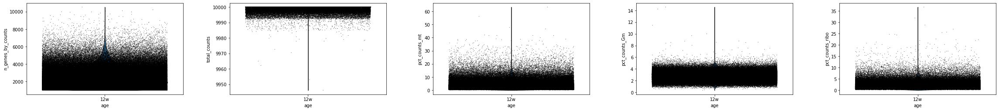

In [9]:
sc.pl.violin(ref, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_Gm','pct_counts_ribo'], groupby = 'age',
             jitter=0.4, multi_panel=True, order = ['12w'])

In [10]:
# scrub just to be safe 
# scrub = scr.Scrublet(ref.X)
# ref.obs['doublet_scores'], ref.obs['predicted_doublets'] = scrub.scrub_doublets()
# scrub.plot_histogram()

In [11]:
# Filter out cells
ref = ref[ref.obs.n_genes_by_counts > 500, :] # takes high quality cells
ref = ref[ref.obs.pct_counts_mt < 10, :] # removes cells with high mt
# ref = ref[ref.obs.predicted_doublets == False] # removes dublets marked with scrubber; if you ran scrublet uncomment

In [12]:
sc.pp.normalize_total(ref, target_sum=1e4)

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [13]:
sc.pp.log1p(ref)

... storing 'phase' as categorical
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit 

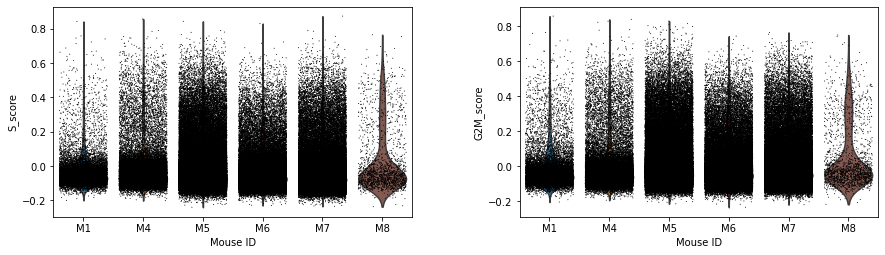

In [14]:
# check for cell cycle genes and score 
cell_cycle_genes = [x.strip() for x in open('/home/svickovi/data/marker_genes/regev_lab_cell_cycle_genes_mouse.txt')]# adjust path

# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in ref.var_names]

# does the scoring
sc.tl.score_genes_cell_cycle(ref, s_genes=s_genes, g2m_genes=g2m_genes)

# plots cell cycle score per processed channel 
sc.pl.violin(ref, ['S_score', 'G2M_score'], jitter=0.4, groupby = 'Mouse_ID')

In [37]:
# Set the .raw attribute of AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
# ref.raw = ref

In [38]:
# #sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
# sc.pp.highly_variable_genes(
#     ref,
#     flavor="seurat",
#     n_top_genes=2000,
#     batch_key="Mouse_ID",
#     subset=True
# )

# # plots these 2k top genes
# sc.pl.highly_variable_genes(adata)

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [16]:
# subsets manually based on Chris genes
ref = ref[:,ref.var_names.isin(aba['gene'])]

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [17]:
sc.pp.regress_out(ref, ['total_counts', 'pct_counts_mt', 'S_score', 'G2M_score'])

Scale each gene to unit variance. Clip values exceeding standard deviation 10. 

In [18]:
sc.pp.scale(ref, max_value=10)

Sanity check how regression worked on mt- and cell cycle

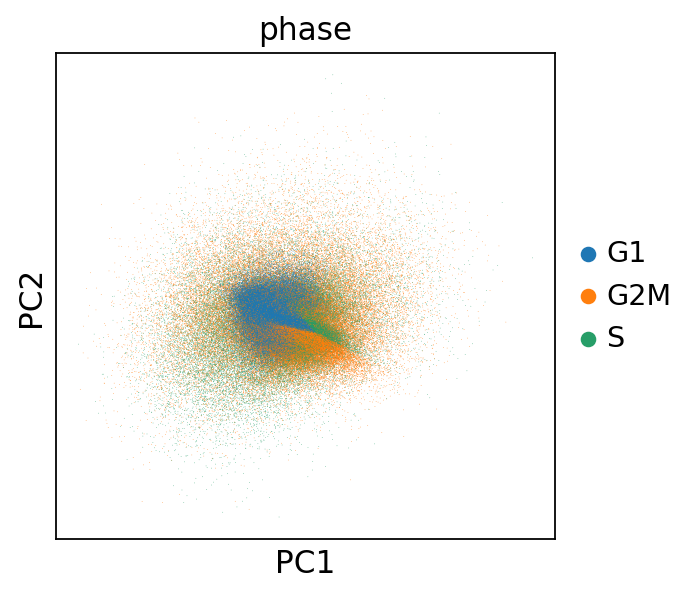

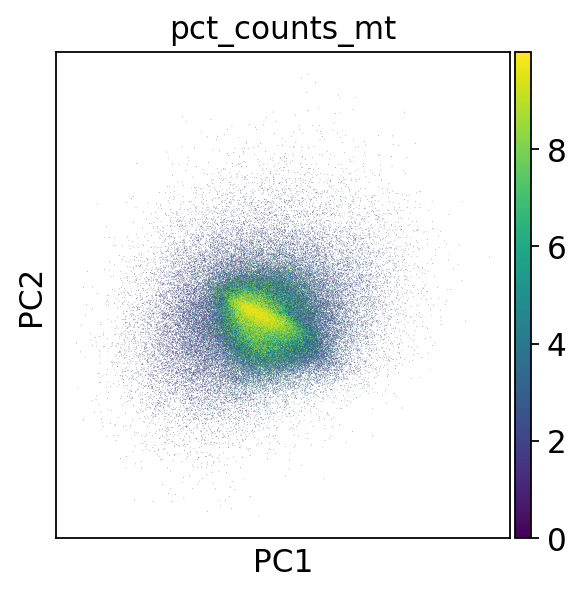

In [19]:
adata_cc_genes = ref[:, ref.var_names.isin(cell_cycle_genes)]
sc.tl.pca(adata_cc_genes)
sc.pl.pca_scatter(adata_cc_genes, color='phase')
sc.pl.pca_scatter(adata_cc_genes, color='pct_counts_mt')

### Principal component analysis

In [20]:
%env PYTHONHASHSEED=0
sc.tl.pca(ref, svd_solver='arpack')
sc.pp.neighbors(ref, n_neighbors=10, n_pcs=40)
sc.tl.umap(ref)

env: PYTHONHASHSEED=0


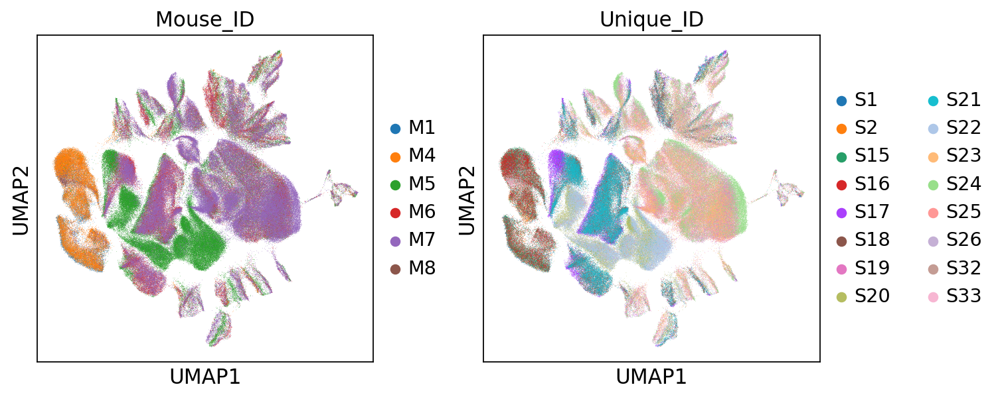

In [22]:
# Sanity check before harmony
sc.pl.umap(ref, color=['Mouse_ID','Unique_ID'])

In [42]:
#ref.write_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_before_harmony_12w.h5ad')

In [5]:
#ref = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_before_harmony_12w.h5ad')

### Use harmony for batch correction

In [23]:
'Use harmony to correct for difference between animals'
ref.obsm['X_harmony'] = harmonize(np.array(ref.obsm['X_pca']), ref.obs, batch_key = ['Unique_ID'])

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
Reach convergence after 8 iteration(s).


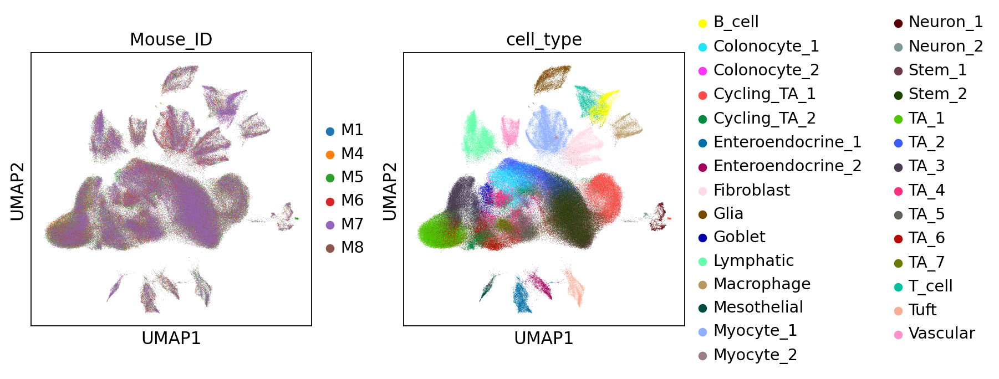

In [24]:
sc.pp.neighbors(ref, use_rep='X_harmony', n_neighbors=10, n_pcs=40)
sc.tl.umap(ref)
sc.pl.umap(ref, color=['Mouse_ID','cell_type',])

In [9]:
# ref.write_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_harmony_12w.h5ad')

In [ ]:
# ref = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_harmony_12w.h5ad')

In [73]:
'Use Phenograph'
result = sce.tl.phenograph(ref.obsm['X_harmony'], k = 25)
ref.obs['pheno'] = pd.Categorical(result[0])

Finding 25 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1636.6813559532166 seconds
Jaccard graph constructed in 27.12047815322876 seconds
Wrote graph to binary file in 34.18522334098816 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.903425
After 6 runs, maximum modularity is Q = 0.904457
Louvain completed 26 runs in 745.9711954593658 seconds
PhenoGraph complete in 2445.7379326820374 seconds


In [74]:
#ref.write_h5ad('adata_colons_dev_after_pheno_12w_k25.h5ad')

In [26]:
#ref = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_pheno_12w_k25.h5ad')

In [88]:
'Do tsne on pheno'
sc.tl.tsne(ref, use_rep = "X_harmony", n_pcs=30, random_state = 7,  perplexity=20, use_fast_tsne = True)


In [90]:
# ref.write_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_tsne_12w_k25.h5ad')

In [3]:
#ref = sc.read_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_tsne_12w_k25.h5ad')

Plots tsne and umap to help with cluster merging

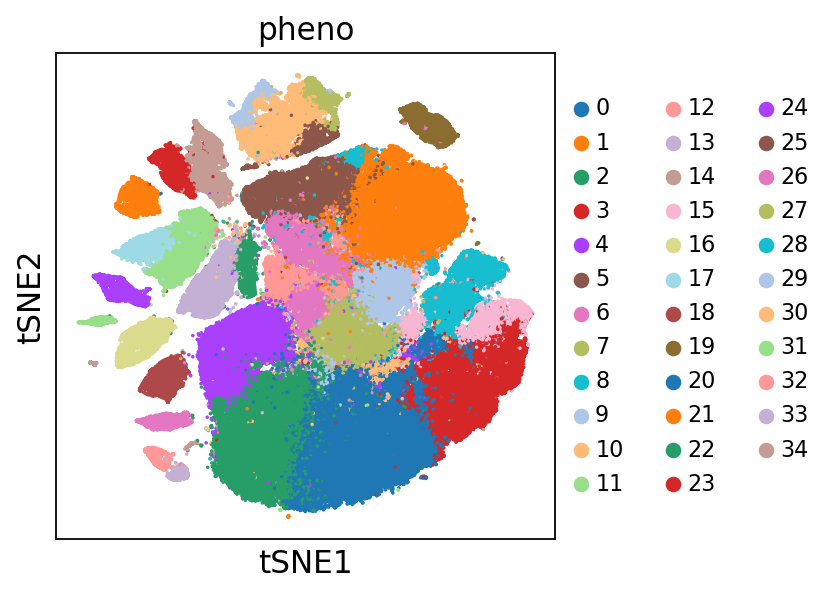

In [4]:
sc.pl.tsne(ref, color = ['pheno'], s = 10, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)

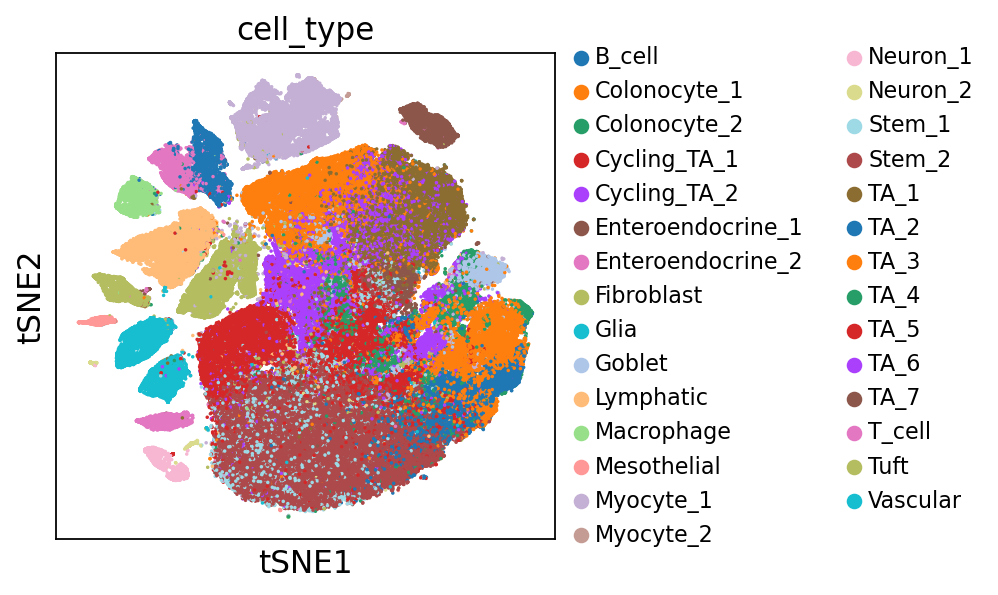

In [29]:
sc.pl.tsne(ref, color = ['cell_type'], s = 10, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)

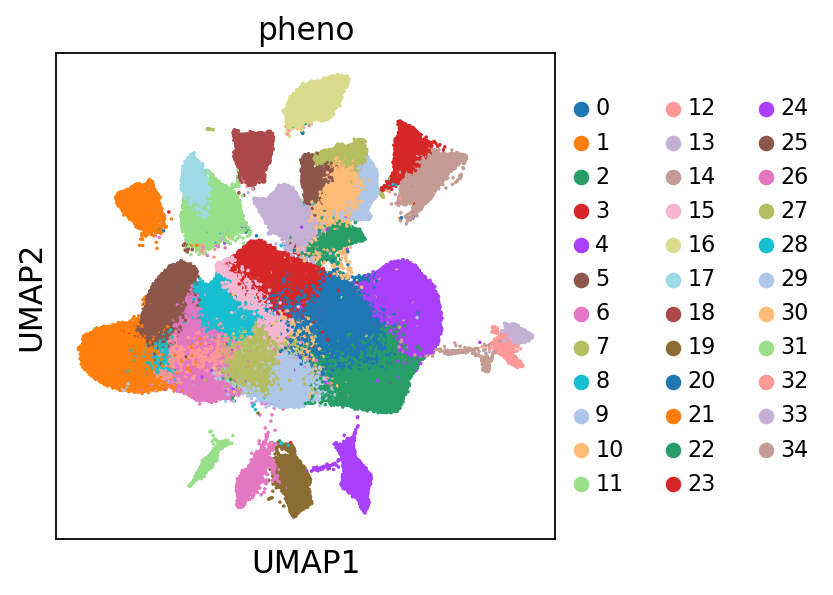

In [32]:
sc.pl.umap(ref, color = ['pheno'], s = 10, legend_fontsize = 10)

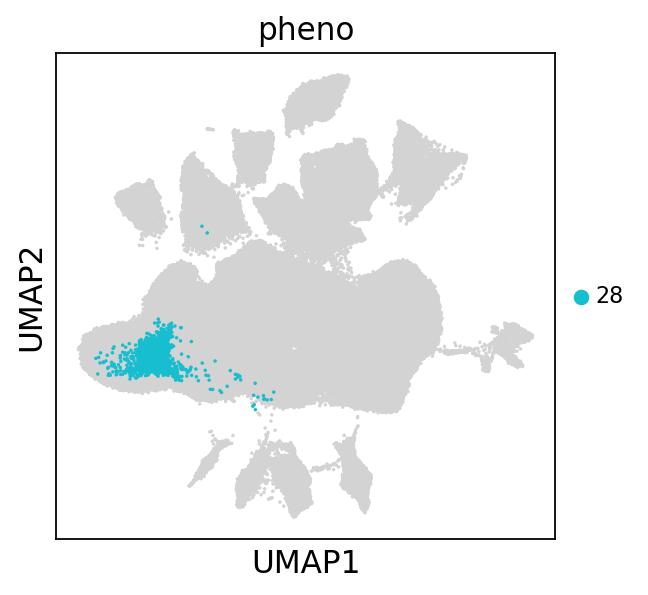

In [114]:
sc.pl.umap(ref, groups = [28], color = ['pheno'], s = 10, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)

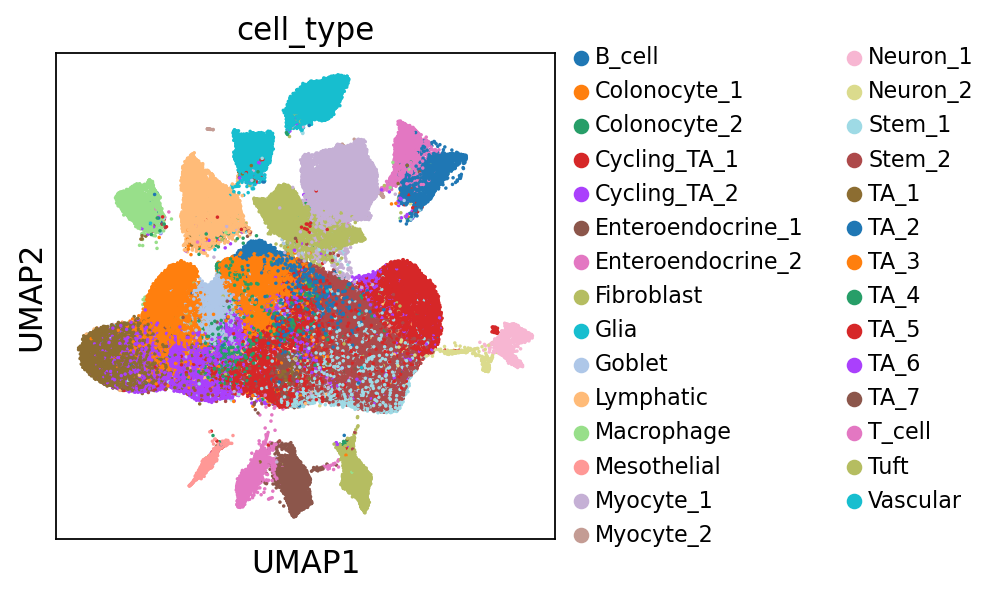

In [66]:
sc.pl.umap(ref, color = ['cell_type'], s = 10, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)

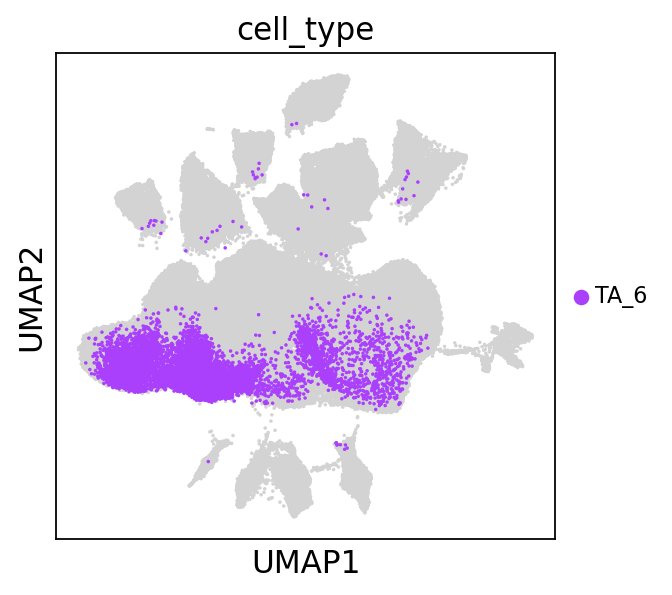

In [113]:
sc.pl.umap(ref, color = ['cell_type'], groups = ['TA_6'], s = 10, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)

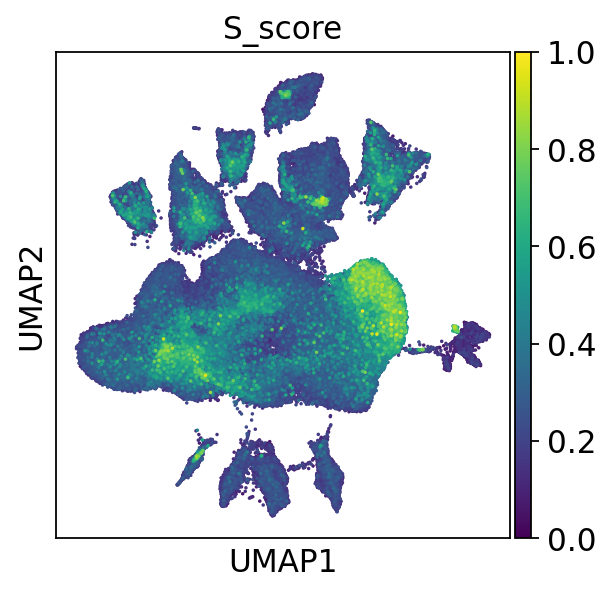

In [95]:
sc.pl.umap(ref, color = ['S_score'], s = 10, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)

In [5]:
# do cluster renaming to be sure all possible cells make it
pheno_to_ct = {
    0 : 'Stem_1',
    1 : 'TA_1',  
    2 : 'Stem_2', 
    3 : 'Colonocyte_1',  
    4 : 'Cycling_TA_1',  
    5 : 'TA_3', 
    6 : 'TA_4', #Cycling_TA_2
    7 : 'TA_5',  #TA5
    8 : 'Goblet',  
    9 : 'TA_7', 
    10 : 'Myocyte_1',
    11 : 'Lymphatic',  
    12 : 'Cycling_TA_2',
    13 : 'Fibroblast',  
    14 : 'B_cell',  
    15 : 'Colonocyte_2', 
    16 : 'Glia',
    17 : 'Lymphatic',  
    18 : 'Vascular',  
    19 : 'Enteroendocrine_1', 
    20 : 'TA_2',
    21 : 'Macrophage',
    22 : 'Fibroblast',
    23 : 'T_cell',
    24 : 'Tuft',
    25 : 'Myocyte_1',
    26 : 'Enteroendocrine_2', 
    27 : 'Myocyte_1',
    28 : 'TA_1',
    29 : 'Myocyte_1',
    30 : 'TA_6',
    31 : 'Mesothelial',
    32 : 'Neuron_1',
    33 : 'Neuron_1',
    34 : 'Neuron_2',
}

In [126]:
ref.obs['pheno_cell_types'] = pd.Categorical(ref.obs['pheno'].replace(pheno_to_ct))

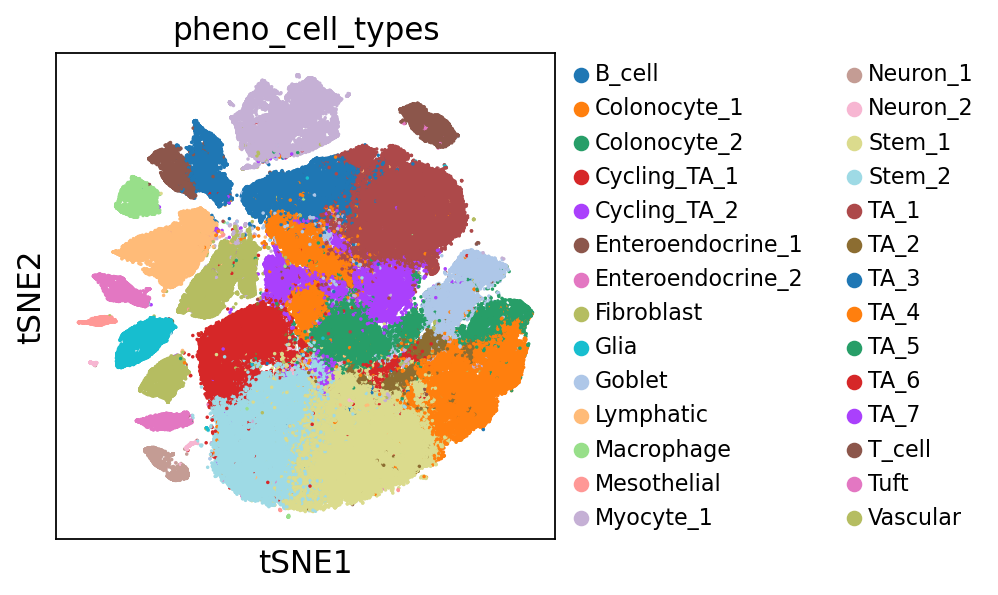

In [136]:
sc.pl.tsne(ref, color = ['pheno_cell_types'],  s = 10,  legend_fontsize = 10)

In [118]:
ref.obs.leiden = ref.obs.leiden.astype('category')

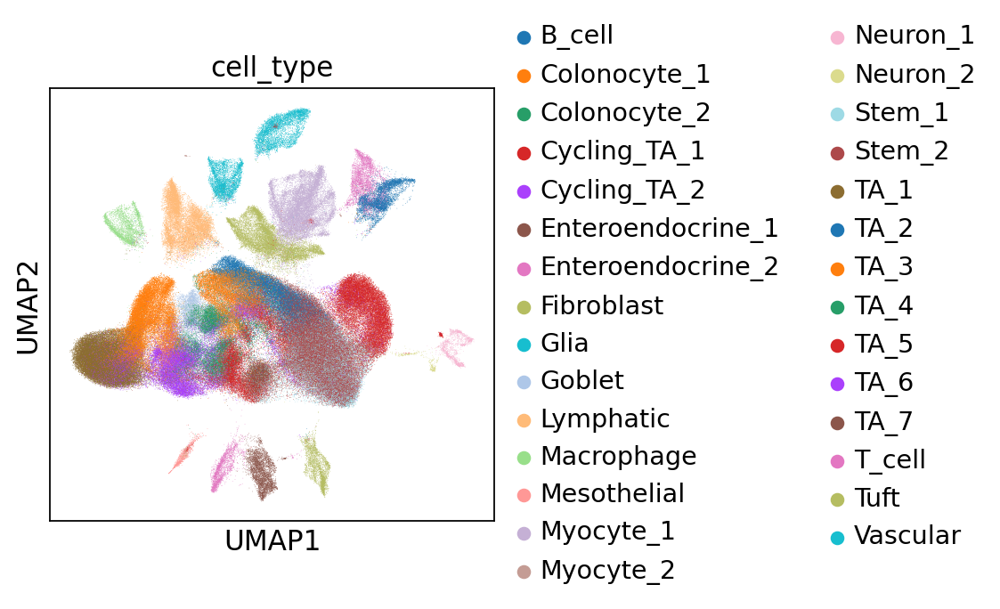

In [119]:
sc.pl.umap(ref, color=['cell_type'])

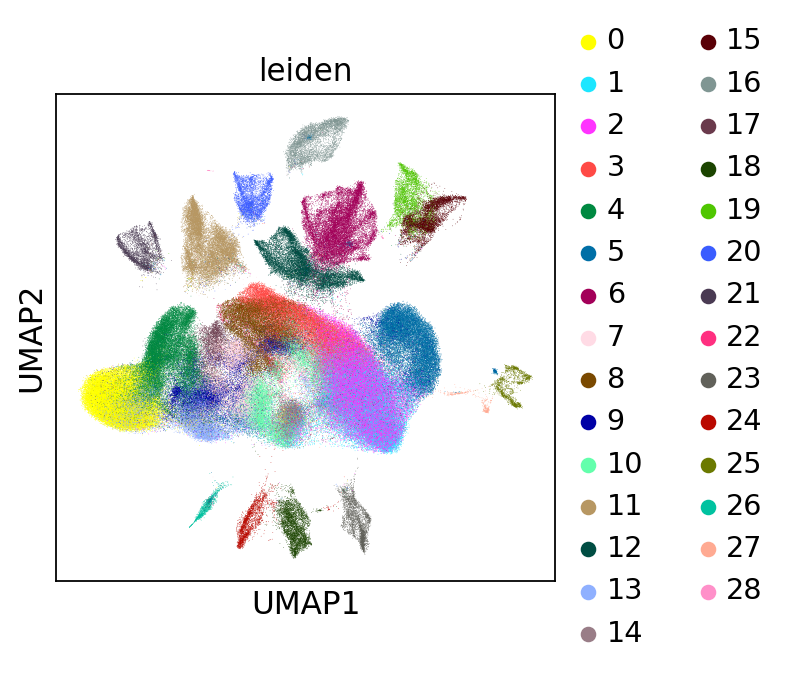

In [39]:
sc.pl.umap(ref, color=['leiden'])

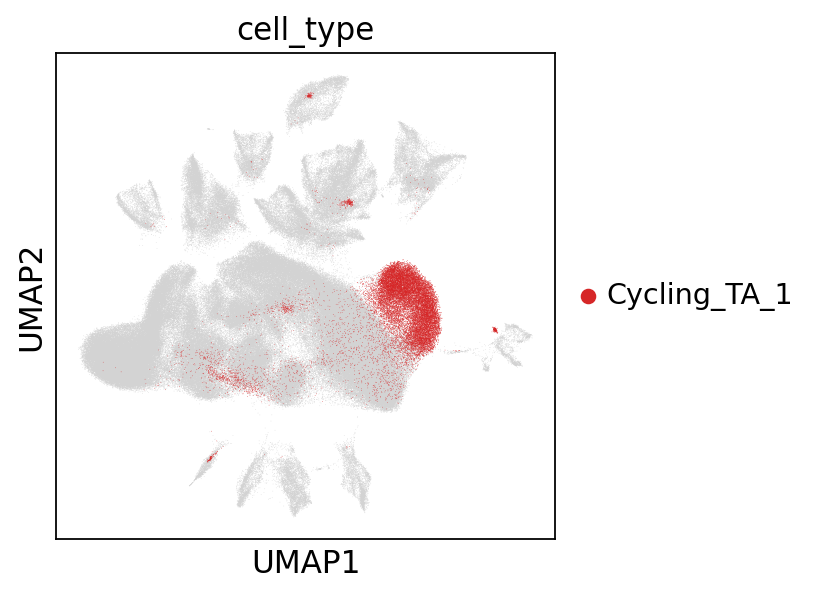

In [52]:
sc.pl.umap(ref, color=['cell_type'], groups = ['Cycling_TA_1'])

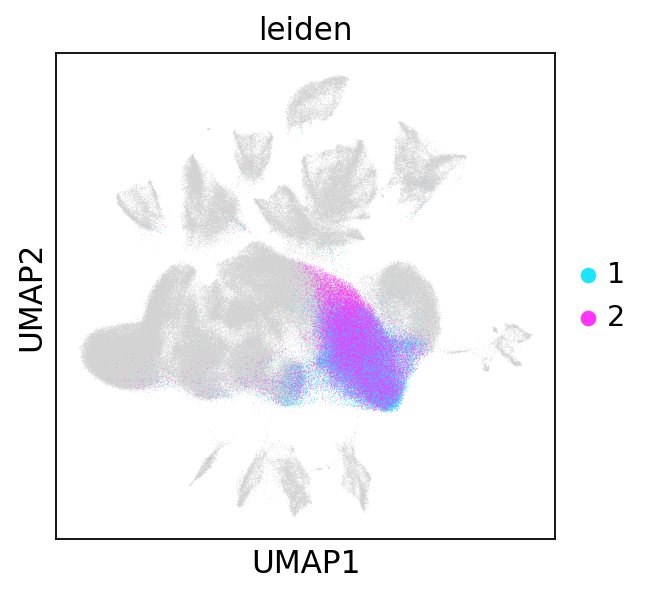

In [51]:
sc.pl.umap(ref, color=['leiden'], groups = [1, 2])

In [7]:
# do cluster renaming to be sure all possible cells make it
leiden_to_ct = {
    0 : 'TA_1',
    1 : 'Stem_1',  
    2 : 'Stem_2', 
    3 : 'TA_2',  
    4 : 'TA_3',  
    5 : 'Cycling_TA_1', 
    6 : 'Myocyte_1',
    7 : 'TA_4',  
    8 : 'Colonocyte_1',  
    9 : 'Cycling_TA_2', 
    10 : 'TA_5',
    11 : 'Lymphatic',  
    12 : 'Fibroblast',
    13 : 'TA_6',  
    14 : 'TA_7',  
    15 : 'B_cell', 
    16 : 'Glia',
    17 : 'Goblet',  
    18 : 'Enteroendocrine_1',  
    19 : 'T_cell', 
    20 : 'Vascular',
    21 : 'Macrophage',
    22 : 'Colonocyte_2',
    23 : 'Tuft',
    24 : 'Enteroendocrine_2',
    25 : 'Neuron_1',
    26 : 'Mesothelial', 
    27 : 'Neuron_2',
    28 : 'Myocyte_2',
}

In [8]:
ref.obs['leiden_cell_types'] = pd.Categorical(ref.obs['leiden'].replace(leiden_to_ct))

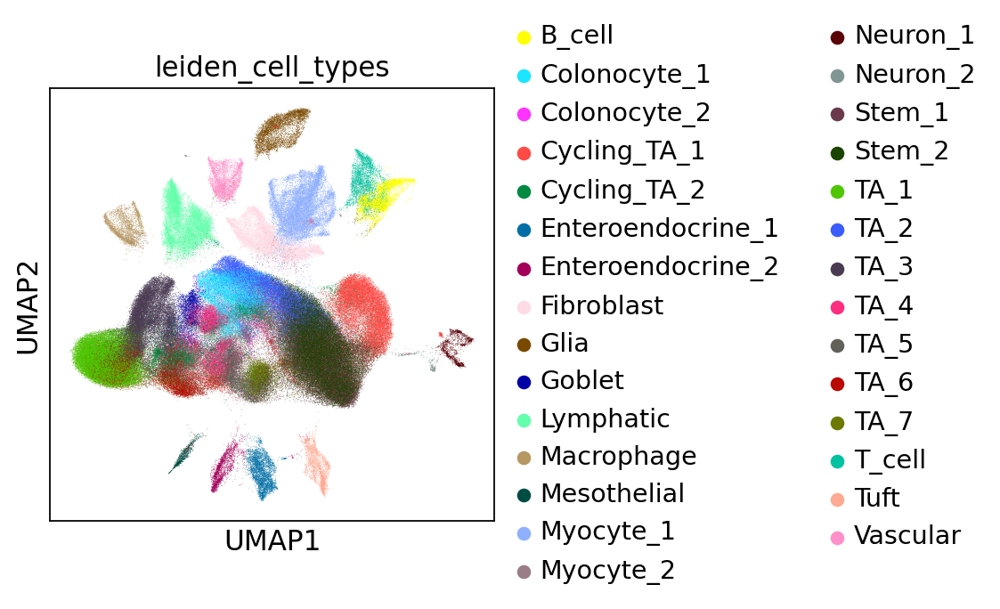

In [9]:
sc.pl.umap(ref, color=['leiden_cell_types'])

In [118]:
'Adds DE genes by leiden grouping'
rec_names = []
rec_names_cats = []
rec_scores = []
rec_pvals = []
rec_padj = []
rec_logs = []
for ident in np.unique(aba['ident']):
    if ident in np.unique(ref.obs.leiden_cell_types):
        rec_scores.append(list(aba[aba['ident'] == ident]['mean']))
        rec_padj.append(list(aba[aba['ident'] == ident]['padjD']))
        rec_logs.append(list(aba[aba['ident'] == ident]['log2fc']))
        rec_pvals.append(list(aba[aba['ident'] == ident]['padjH']))
        rec_names.append(list(aba[aba['ident'] == ident].gene))
        rec_names_cats.append(ident)
rec_names_final = pd.DataFrame(rec_names, index = rec_names_cats).T.to_records(index = False,column_dtypes='O')
rec_scores_final = pd.DataFrame(rec_scores, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')
rec_padj_final = pd.DataFrame(rec_padj, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')
rec_logs_final = pd.DataFrame(rec_logs, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')
rec_pvals_final = pd.DataFrame(rec_pvals, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')

ref.uns['leiden_cell_types']['params'] = {
             'groupby': 'leiden_cell_types',
             'reference': 'rest',
             'method': 't-test',
             'use_raw': True,
             'layer': None,
             'corr_method': 'benjamini-hochberg'}
ref.uns['leiden_cell_types']['names'] = rec_names_final
ref.uns['leiden_cell_types']['scores'] = rec_scores_final
ref.uns['leiden_cell_types']['pvals'] = rec_pvals_final
ref.uns['leiden_cell_types']['pvals_adj'] = rec_padj_final
ref.uns['leiden_cell_types']['logfoldchanges'] = rec_logs_final

In [141]:
'Adds DE genes by pheno grouping'
rec_names = []
rec_names_cats = []
rec_scores = []
rec_pvals = []
rec_padj = []
rec_logs = []
for ident in np.unique(aba['ident']):
    if ident in np.unique(ref.obs.pheno_cell_types):
        rec_scores.append(list(aba[aba['ident'] == ident]['mean']))
        rec_padj.append(list(aba[aba['ident'] == ident]['padjD']))
        rec_logs.append(list(aba[aba['ident'] == ident]['log2fc']))
        rec_pvals.append(list(aba[aba['ident'] == ident]['padjH']))
        rec_names.append(list(aba[aba['ident'] == ident].gene))
        rec_names_cats.append(ident)
rec_names_final = pd.DataFrame(rec_names, index = rec_names_cats).T.to_records(index = False,column_dtypes='O')
rec_scores_final = pd.DataFrame(rec_scores, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')
rec_padj_final = pd.DataFrame(rec_padj, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')
rec_logs_final = pd.DataFrame(rec_logs, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')
rec_pvals_final = pd.DataFrame(rec_pvals, index = rec_names_cats).T.to_records(index = False,column_dtypes='float32')

ref.uns['pheno_cell_types'] = dict()
ref.uns['pheno_cell_types']['params'] = {
             'groupby': 'pheno_cell_types',
             'reference': 'rest',
             'method': 't-test',
             'use_raw': True,
             'layer': None,
             'corr_method': 'benjamini-hochberg'}
ref.uns['pheno_cell_types']['names'] = rec_names_final
ref.uns['pheno_cell_types']['scores'] = rec_scores_final
ref.uns['pheno_cell_types']['pvals'] = rec_pvals_final
ref.uns['pheno_cell_types']['pvals_adj'] = rec_padj_final
ref.uns['pheno_cell_types']['logfoldchanges'] = rec_logs_final

In [130]:
'Rank genes yourself if needed'
sc.tl.rank_genes_groups(ref, groupby = 'leiden_cell_types', use_raw=True, groups='all', reference='rest',key_added='leiden_cell_types_scanpy', method='t-test', corr_method='benjamini-hochberg'
                       )

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


In [132]:
'Rank genes yourself if needed'
sc.tl.rank_genes_groups(ref, groupby = 'pheno_cell_types', use_raw=True, groups='all', reference='rest',key_added='pheno_cell_types_scanpy', method='t-test', corr_method='benjamini-hochberg')

/home/svickovi/miniconda3/envs/stenv3/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


In [58]:
# sc.tl.filter_rank_genes_groups(ref, key='leiden_cell_types', groupby='leiden_cell_types', use_raw=False, 
#                                key_added='leiden_cell_types_filtered', min_fold_change='.5',
#                                min_in_group_fraction='0.1', max_out_group_fraction='0.5')

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.


KeyboardInterrupt



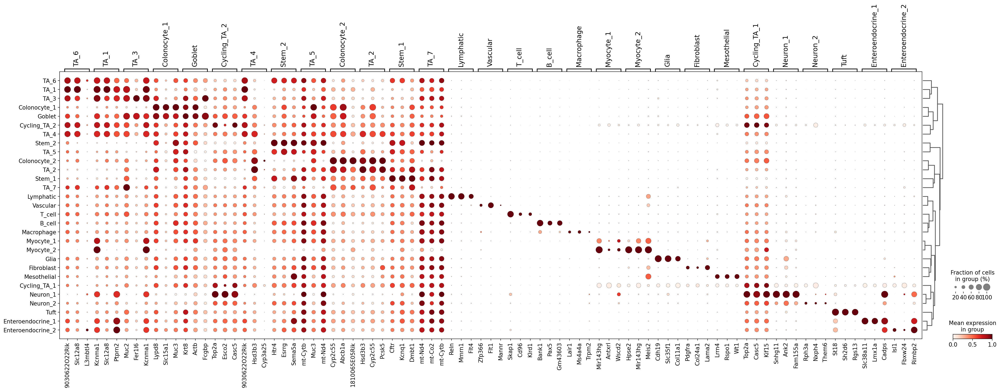

In [123]:
sc.pl.rank_genes_groups_dotplot(ref, key='leiden_cell_types', n_genes=3, groupby=['leiden_cell_types'], standard_scale = 'var',)

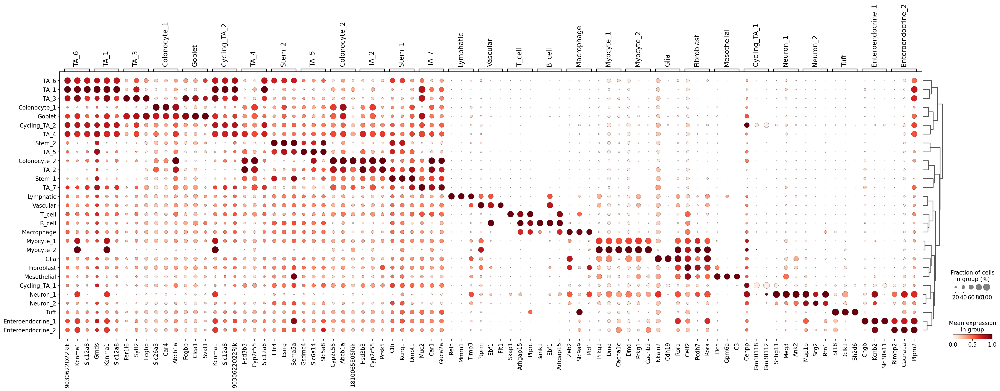

In [133]:
sc.pl.rank_genes_groups_dotplot(ref, key='leiden_cell_types_scanpy', n_genes=3, groupby=['leiden_cell_types'], standard_scale = 'var',)

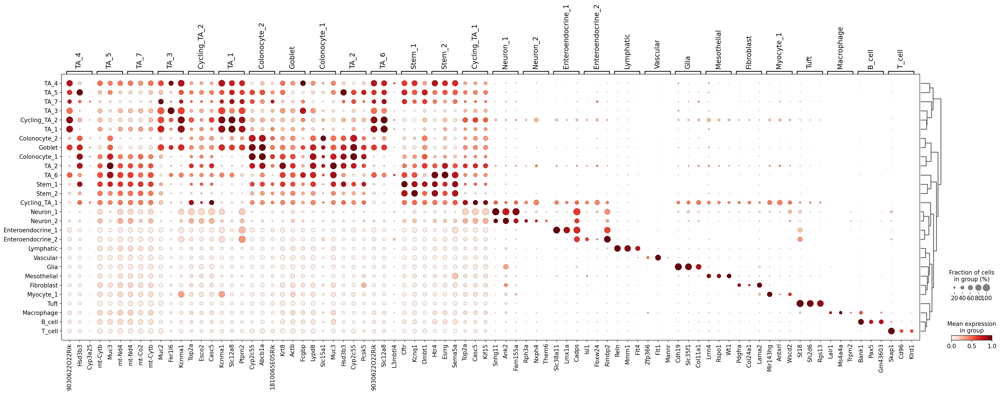

In [143]:
sc.tl.dendrogram(ref, groupby=['pheno_cell_types'])
sc.pl.rank_genes_groups_dotplot(ref, key='pheno_cell_types', n_genes=3, groupby=['pheno_cell_types'],
                                standard_scale = 'group', )

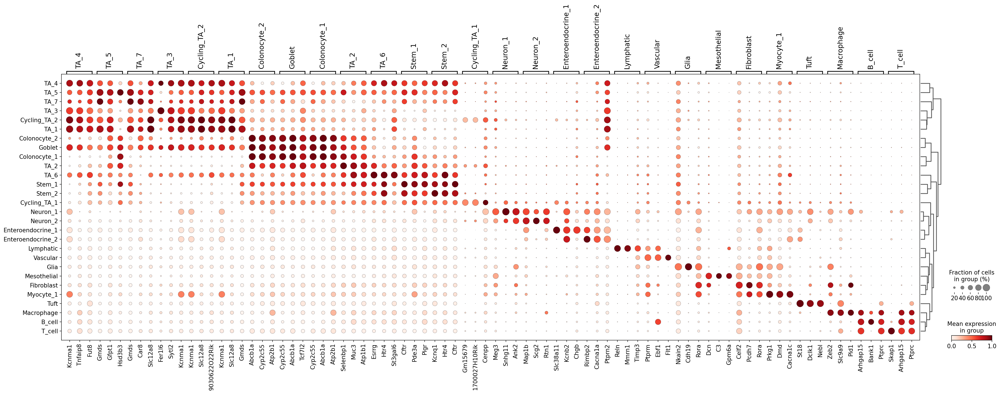

In [144]:
sc.tl.dendrogram(ref, groupby=['pheno_cell_types'])
sc.pl.rank_genes_groups_dotplot(ref, key='pheno_cell_types_scanpy', n_genes=3, groupby=['pheno_cell_types'],
                                standard_scale = 'group', )

In [145]:
ref.write_h5ad('/home/svickovi/data/sc_anndatas/adata_colons_dev_after_tsne_12w_k25_after_renaming.h5ad')

In [146]:
ref

AnnData object with n_obs × n_vars = 328106 × 2105
    obs: 'leiden', 'Unique_ID', 'Sample_ID', 'Mouse_ID', 'Sex', 'cell_type', 'age', 'predicted_doublets', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_Gm', 'log1p_total_counts_Gm', 'pct_counts_Gm', 'S_score', 'G2M_score', 'phase', 'pheno', 'pheno_cell_types', 'leiden_cell_types'
    var: 'n_cells', 'Gm', 'ribo', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std'
    uns: 'Mouse_ID_colors', 'cell_type_colors', 'neighbors', 'pca', 'pheno_colors', 'umap', 'leiden_cell_types_colors', 'leiden_cell_types', "dendrogram_['leiden_cell_types']", 'pheno_cell_types', 'leiden_cell_types_scanpy', 'pheno_cell_types_scanpy', "dendrogram_['pheno_cell_types']"
    obsm: 'X_ha